In [8]:
import matplotlib.pyplot as plt
import os
import mxnet as mx
import mxnet.gluon as g
import mxnet.ndarray as nd
import itertools
import numpy as np
import pandas as pd
import cv2
import tqdm as tqdm

batch_size = 2
img_wd = 28 
img_ht = 28

def img_transform(data, label):
    data = data.transpose((2, 0, 1))
    return (data.astype('float32') / 255 - 0.5) / 0.5, label.astype('float32')

dataset = g.data.vision.MNIST(transform=img_transform)
dataloader = g.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

fashin_dataset = g.data.vision.FashionMNIST(train=True, transform=img_transform)
dataloader = g.data.DataLoader( fashin_dataset, batch_size=batch_size, shuffle=True)

train_data = [i[0] for i in itertools.islice(dataloader,  12)]
# for data, label in train_data:
#    print(data.shape)
#    print(label.shape)

print(dataset[0][0].shape)
def visualize(img_arr):
    plt.imshow((img_arr.reshape(img_wd, img_ht) * 255).astype(np.uint8), cmap='gray')
    plt.axis('off')

def plot_images_4():
    for i in range(4):
        plt.subplot(1,4,i+1)
        visualize(nd.array(dataset[i + 10][0]))
    plt.show()

(1, 28, 28)


In [9]:
def show_dogs():
    data_dir = '/data/ai/data/kaggle_dog-breed-identification/data'
    df = pd.read_csv(os.path.join(data_dir, "labels.csv"))
                     
    df["image_path"] = os.path.join(data_dir, "train/") + df["id"] + ".jpg"
    df["image"] = None
    breeds = set(df["breed"].values)
    print(breeds)
    for breed in breeds:
        print("breed", breed)
        dog = df[df["breed"] == breed].iloc[0]
        img=cv2.imread(dog.image_path)
        plt.imshow(img)
        plt.show()
#show_dogs()

In [10]:
def get_mean_std(img_list, path):
    r = 0 # r mean
    g = 0 # g mean
    b = 0 # b mean

    r_2 = 0 # r^2 
    g_2 = 0 # g^2
    b_2 = 0 # b^2

    total = 0
    for img_name in img_list:
        img = mx.image.imread(path + img_name) # ndarray, width x height x 3
        img = img.astype('float32') / 255.
        total += img.shape[0] * img.shape[1]
    
        r += img[:, :, 0].sum().asscalar()
        g += img[:, :, 1].sum().asscalar()
        b += img[:, :, 2].sum().asscalar()
    
        r_2 += (img[:, :, 0]**2).sum().asscalar()
        g_2 += (img[:, :, 1]**2).sum().asscalar()
        b_2 += (img[:, :, 2]**2).sum().asscalar()

    r_mean = r / total
    g_mean = g / total
    b_mean = b / total

    r_var = r_2 / total - r_mean ** 2
    g_var = g_2 / total - g_mean ** 2
    b_var = b_2 / total - b_mean ** 2
    r_std = nd.sqrt(r_var)
    g_std = nd.sqrt(g_var)
    b_std = nd.sqrt(b_var)
    return (r_mean, g_mean, b_mean), (r_std, g_std, b_std) 
        
        

{'curly-coated_retriever', 'miniature_pinscher', 'groenendael', 'black-and-tan_coonhound', 'soft-coated_wheaten_terrier', 'vizsla', 'yorkshire_terrier', 'eskimo_dog', 'afghan_hound', 'norwich_terrier', 'miniature_poodle', 'tibetan_mastiff', 'lhasa', 'pekinese', 'maltese_dog', 'african_hunting_dog', 'old_english_sheepdog', 'giant_schnauzer', 'german_shepherd', 'chesapeake_bay_retriever', 'borzoi', 'schipperke', 'leonberg', 'basenji', 'appenzeller', 'doberman', 'kerry_blue_terrier', 'german_short-haired_pointer', 'cocker_spaniel', 'pomeranian', 'rottweiler', 'lakeland_terrier', 'japanese_spaniel', 'bluetick', 'kuvasz', 'shih-tzu', 'sussex_spaniel', 'dingo', 'weimaraner', 'italian_greyhound', 'papillon', 'kelpie', 'standard_poodle', 'chow', 'newfoundland', 'norwegian_elkhound', 'entlebucher', 'blenheim_spaniel', 'collie', 'bouvier_des_flandres', 'irish_terrier', 'basset', 'australian_terrier', 'toy_poodle', 'rhodesian_ridgeback', 'saint_bernard', 'silky_terrier', 'pug', 'walker_hound', 'a

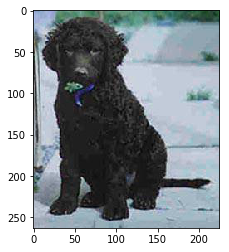

breed miniature_pinscher


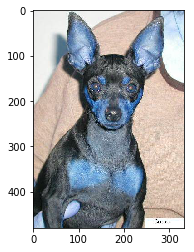

breed groenendael


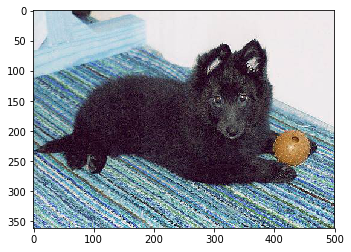

breed black-and-tan_coonhound


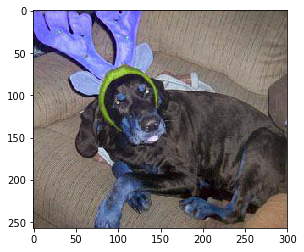

breed soft-coated_wheaten_terrier


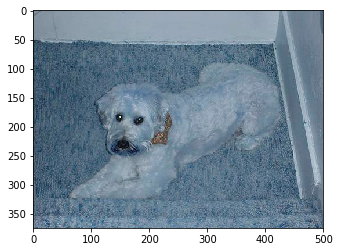

breed vizsla


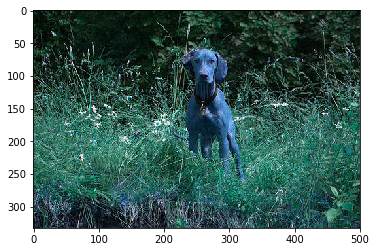

breed yorkshire_terrier


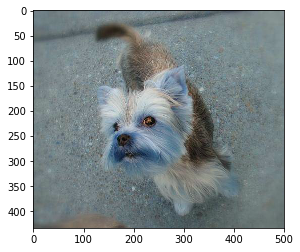

breed eskimo_dog


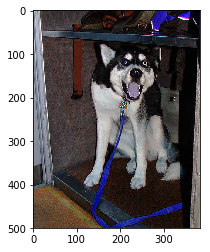

breed afghan_hound


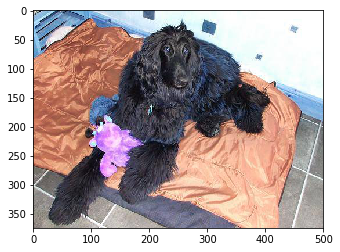

breed norwich_terrier


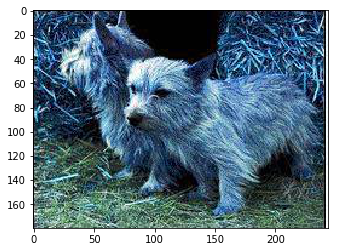

breed miniature_poodle


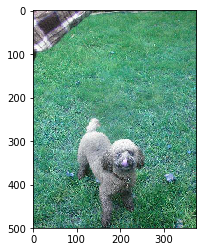

breed tibetan_mastiff


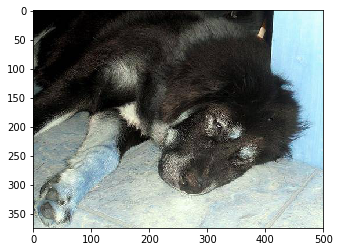

breed lhasa


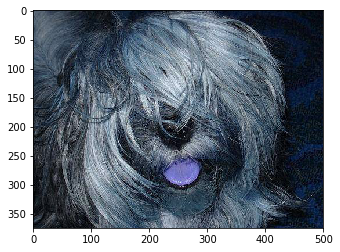

breed pekinese


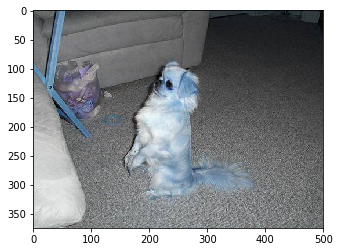

breed maltese_dog


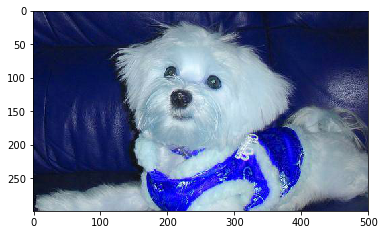

breed african_hunting_dog


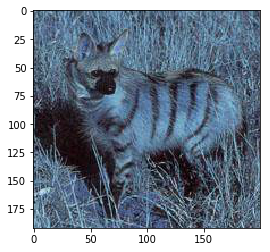

breed old_english_sheepdog


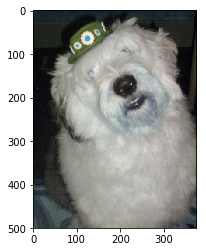

breed giant_schnauzer


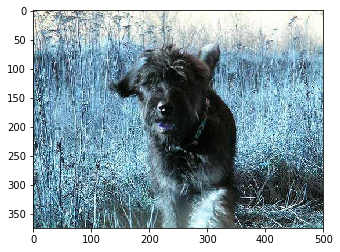

breed german_shepherd


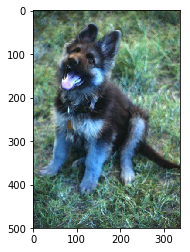

breed chesapeake_bay_retriever


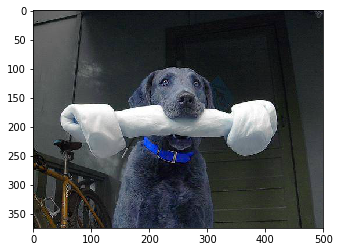

breed borzoi


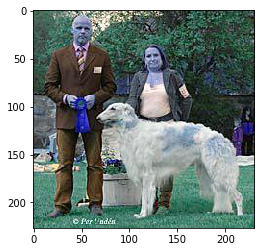

breed schipperke


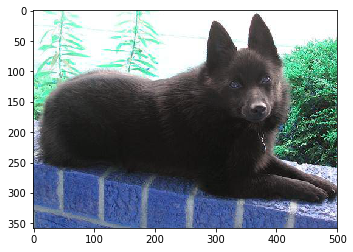

breed leonberg


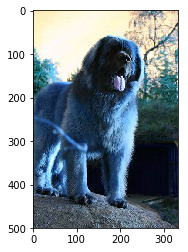

breed basenji


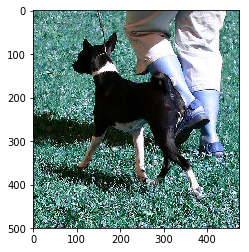

breed appenzeller


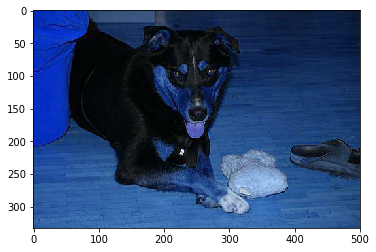

breed doberman


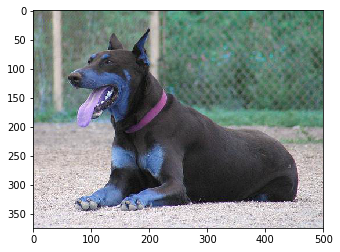

breed kerry_blue_terrier


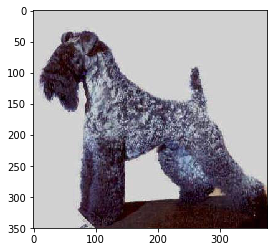

breed german_short-haired_pointer


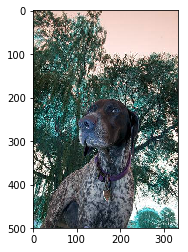

breed cocker_spaniel


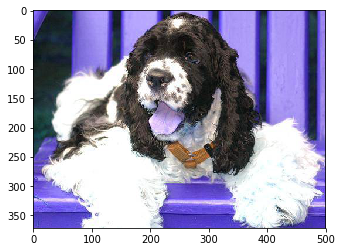

breed pomeranian


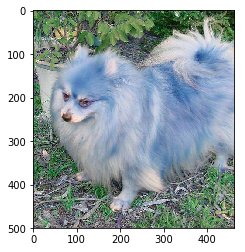

breed rottweiler


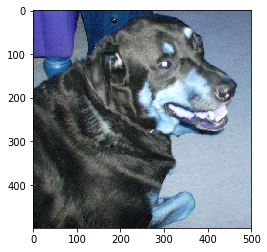

breed lakeland_terrier


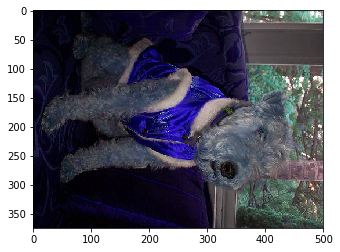

breed japanese_spaniel


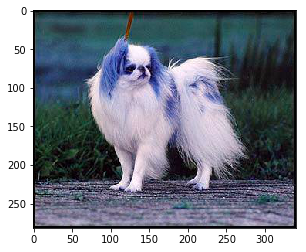

breed bluetick


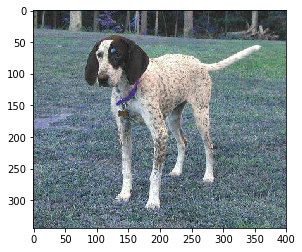

breed kuvasz


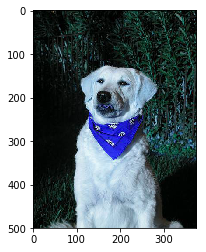

breed shih-tzu


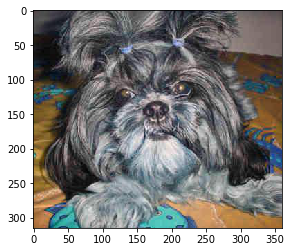

breed sussex_spaniel


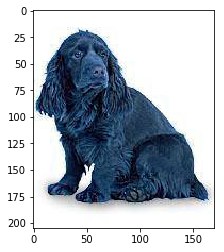

breed dingo


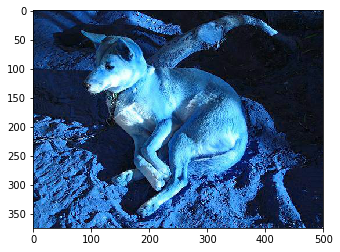

breed weimaraner


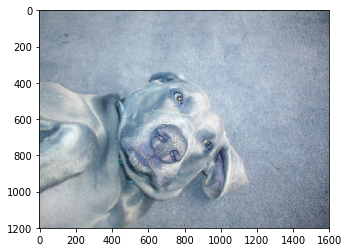

breed italian_greyhound


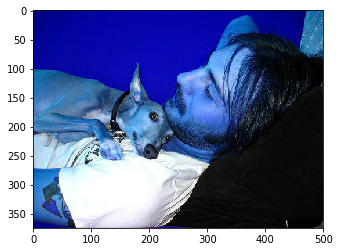

breed papillon


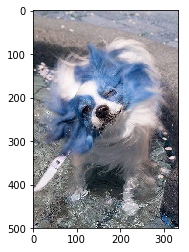

breed kelpie


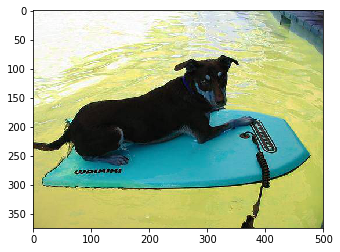

breed standard_poodle


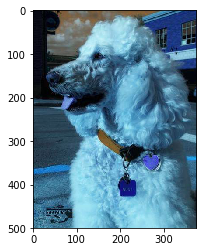

breed chow


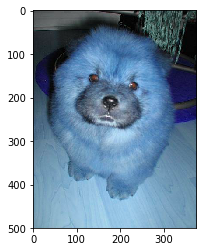

breed newfoundland


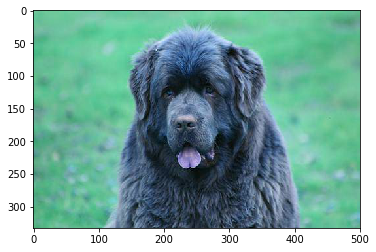

breed norwegian_elkhound


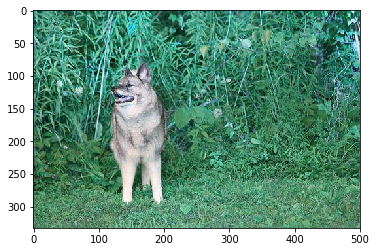

breed entlebucher


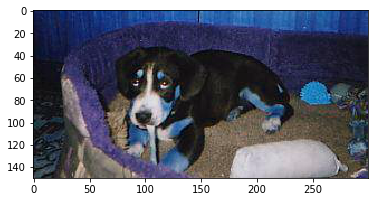

breed blenheim_spaniel


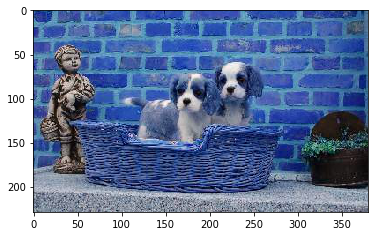

breed collie


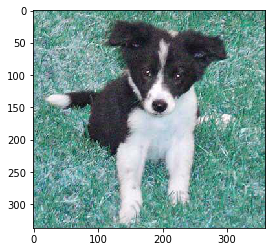

breed bouvier_des_flandres


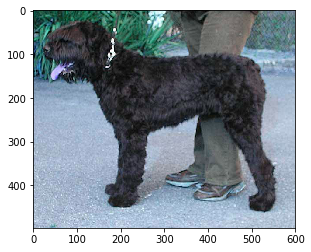

breed irish_terrier


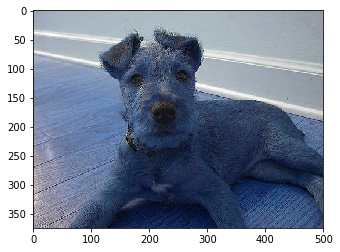

breed basset


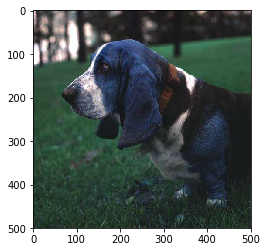

breed australian_terrier


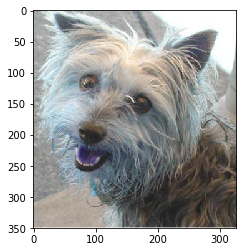

breed toy_poodle


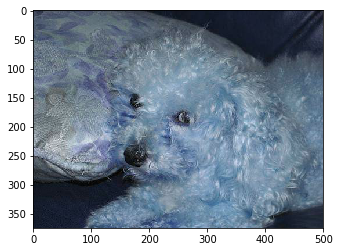

breed rhodesian_ridgeback


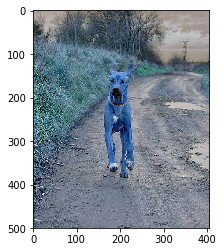

breed saint_bernard


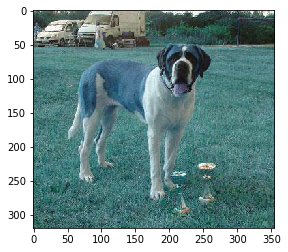

breed silky_terrier


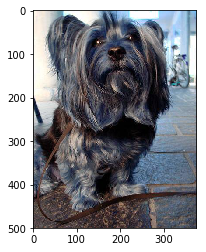

breed pug


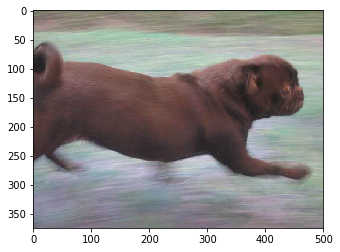

breed walker_hound


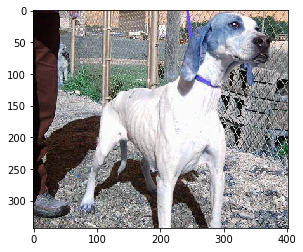

breed american_staffordshire_terrier


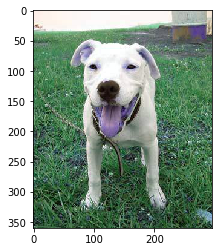

breed great_dane


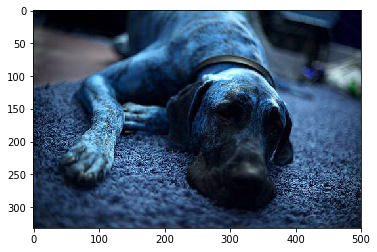

breed sealyham_terrier


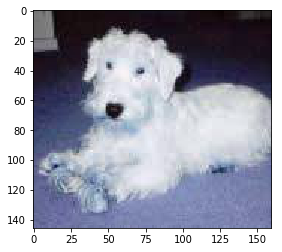

breed cardigan


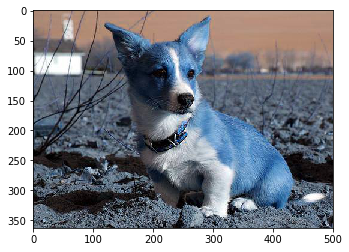

breed scotch_terrier


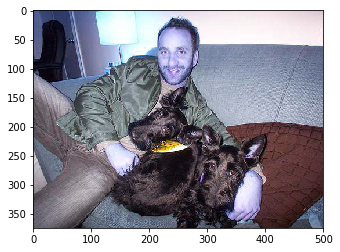

breed french_bulldog


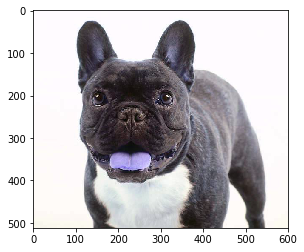

breed siberian_husky


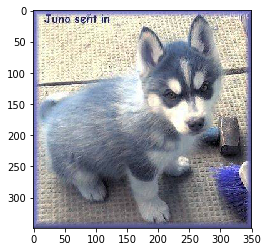

breed irish_water_spaniel


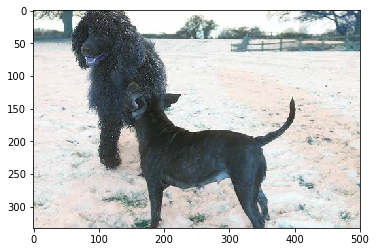

breed otterhound


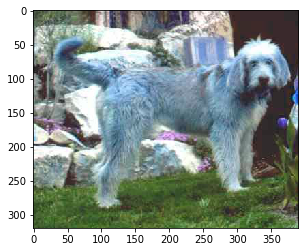

breed west_highland_white_terrier


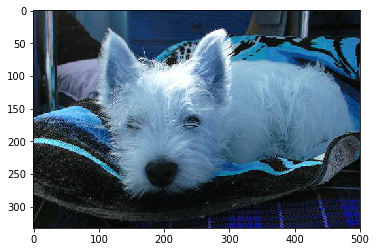

breed bedlington_terrier


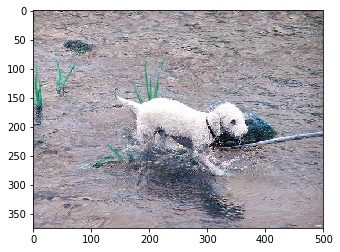

breed golden_retriever


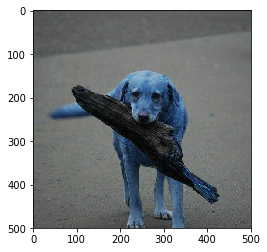

breed staffordshire_bullterrier


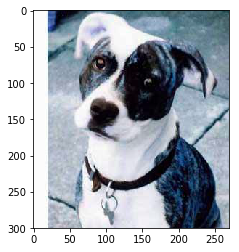

breed saluki


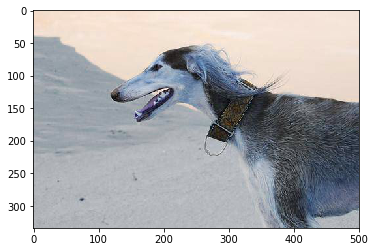

breed greater_swiss_mountain_dog


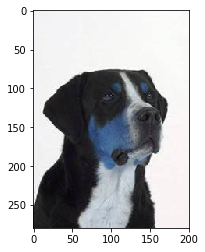

breed boston_bull


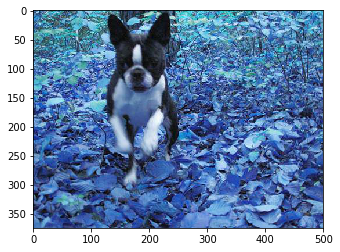

breed english_springer


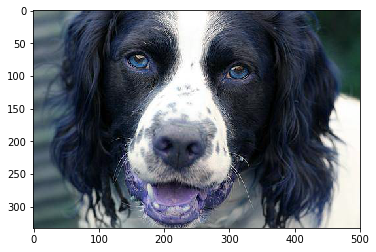

breed miniature_schnauzer


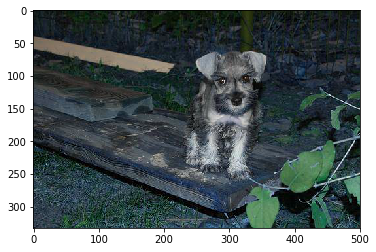

breed samoyed


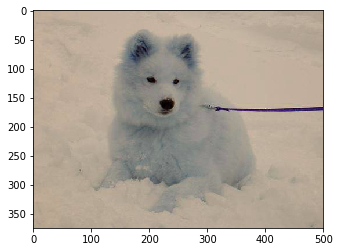

breed irish_wolfhound


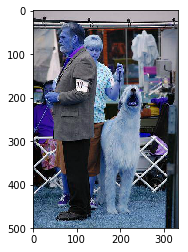

breed gordon_setter


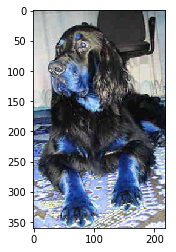

breed labrador_retriever


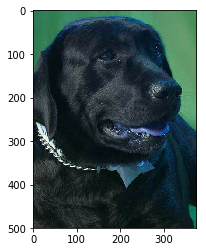

breed malinois


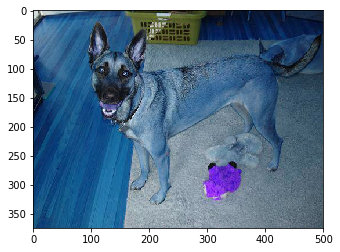

breed flat-coated_retriever


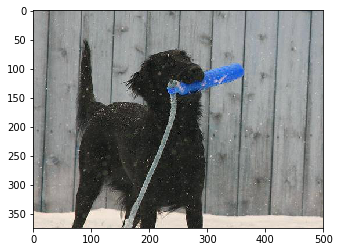

breed border_collie


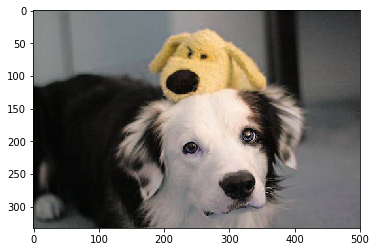

breed airedale


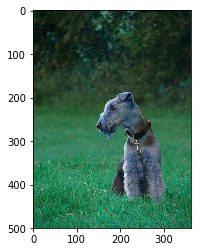

breed toy_terrier


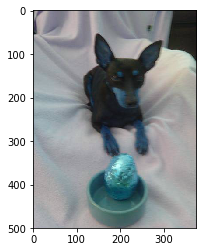

breed beagle


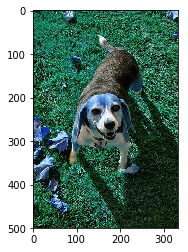

breed norfolk_terrier


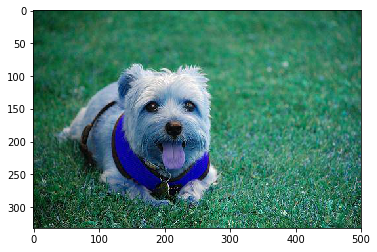

breed clumber


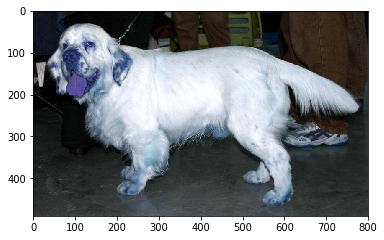

breed bloodhound


In [ ]:
show_dogs()